<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [ ]:
import json

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from tqdm import tqdm
import h5py

In [ ]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
# !{sys.executable} -m pip install h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [ ]:
f = h5py.File('/content/drive/MyDrive/img_codes.hdf5', 'r')
img_codes = f['data']

In [ ]:
captions = json.load(open('/content/drive/MyDrive/captions_tokenized.json'))

In [ ]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [ ]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [ ]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
for img in captions:
  for caption in img:
    for w in caption:
      word_counts[w] +=1

In [ ]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 2 if k not in vocab]
n_tokens = len(vocab)

# assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [ ]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [ ]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  291,  142,   14, 1148,  259,   62,   14, 1315,    2,
           3,    3,    3],
       [   1,   14,  291,   62,   14, 1148,  259,  142,   14, 1315,    2,
           3,    3,    3],
       [   1,   14,   90,  142,   14, 1315,   62,   44,    5,   14, 1311,
          13,    2,    3],
       [   1,   14, 1261, 1401,   14, 1315,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  346,  142,   14, 1315,   62,   14,
        1311,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [ ]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [ ]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        result = torch.matmul(queries, torch.transpose(keys, -2, -1)) / np.sqrt(queries.shape[-1])
        return result

Test for ScaledDotProductScore

In [ ]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [ ]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer
        self.attention_map = None

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        maxim = torch.tensor(87)
        if torch.cuda.is_available():
            maxim = maxim.cuda()
            scores = scores.cuda()
            values = values.cuda()
        scores = torch.min(scores, maxim)
        weights = scores.exp() / scores.exp().sum(dim=-1).unsqueeze(-1)
        self.attention_map = weights.detach()
        result = weights.matmul(values)
        return result

Tests for Attention layer

In [ ]:
attn = Attention(ScaledDotProductScore())

In [ ]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [ ]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [ ]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]], device='cuda:0')
Responses:
 tensor([[[1.0000],
         [1.2552]]], device='cuda:0')


### Language model

In [ ]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # recurrent part, please create the layers as per scheme above.
        
        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size)
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(cnn_channels+emb_size, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = torch.nn.Sequential(nn.Linear(cnn_channels + lstm_units + emb_size, 8 * (cnn_channels + lstm_units + emb_size)),
                                    nn.ReLU(),
                                    nn.Dropout(0.1),
                                    nn.Linear(8 * (cnn_channels + lstm_units + emb_size), n_tokens))
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)

        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)

        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        h_i = initial_hid
        c_i = initial_cell
        # 2. In the recurrent loop over tokens:
        
        for i in range(captions_ix.shape[-1]):
          
          #   2.1. transform image vectors to the keys for attention
          attn_keys = self.cnn_to_attn_key(image_features)
          
          #   2.2. use previous lstm state as an attention query and image vectors as values, apply attention to obtain context vector
          context = self.attention(h_i.unsqueeze(1), attn_keys, image_features)

          #   2.4. store attention map
          if i != 0:
              attn_map = torch.cat((attn_map, self.attention.attention_map), 1)
          else:
              attn_map = self.attention.attention_map

          #   2.5. feed lstm with current token embedding concatenated with context vector, update lstm hidden and cell vectors
          conc = torch.cat((context, captions_emb[:, i].unsqueeze(1)),2)
          h_i, c_i = self.lstm(conc.squeeze(1), (h_i, c_i))
          
          #   2.7. store current lstm hidden state, attention response, and the previous word embedding
          if i != 0:
              conc = torch.cat((conc, h_i.unsqueeze(1)), 2)
              reccurent_out = torch.cat((reccurent_out, conc), 1)
          else:
              reccurent_out = torch.cat((conc, h_i.unsqueeze(1)), 2)
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attn_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(reccurent_out)
        
        # return logits and attention maps from (2.4)
        return logits, attn_map

In [ ]:
network = CaptionNet(n_tokens)
if torch.cuda.is_available():
    network = network.cuda()

In [ ]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)
if torch.cuda.is_available():
    dummy_capt_ix = dummy_capt_ix.cuda()
    dummy_img_vec = dummy_img_vec.cuda()
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 16912])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [ ]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    loss = nn.CrossEntropyLoss(ignore_index=pad_ix)
    if torch.cuda.is_available():
        loss = loss.cuda()

    loss = loss(logits_for_next.transpose(1,2), captions_ix_next)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [ ]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [ ]:
optim = torch.optim.Adam(network.parameters(), lr=1e-3)

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [ ]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [ ]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [ ]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [ ]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [ ]:
batch_size = 64  # adjust me
n_epochs = 40   # adjust me
n_batches_per_epoch = 100  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [ ]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:

            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
            train_loss += float(loss_t)
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            optim.zero_grad()
            loss_t.backward()
            optim.step()
                        
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    # if torch.cuda.is_available():
    #     network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 100/100 [00:46<00:00,  2.14it/s]



Epoch: 0, train loss: 5.0524167585372926, val loss: 4.391179740428925


100%|██████████| 100/100 [00:47<00:00,  2.09it/s]



Epoch: 1, train loss: 4.232059690952301, val loss: 4.045740306377411


100%|██████████| 100/100 [00:48<00:00,  2.08it/s]



Epoch: 2, train loss: 4.015226137638092, val loss: 4.020731687545776


100%|██████████| 100/100 [00:47<00:00,  2.11it/s]



Epoch: 3, train loss: 3.8861457562446593, val loss: 3.909984141588211


100%|██████████| 100/100 [00:43<00:00,  2.29it/s]



Epoch: 4, train loss: 3.8329651498794557, val loss: 3.8156005144119263


100%|██████████| 100/100 [00:46<00:00,  2.13it/s]



Epoch: 5, train loss: 3.7634888744354247, val loss: 3.6766759753227234


100%|██████████| 100/100 [00:49<00:00,  2.01it/s]



Epoch: 6, train loss: 3.713402409553528, val loss: 3.7037194073200226


100%|██████████| 100/100 [00:49<00:00,  2.01it/s]



Epoch: 7, train loss: 3.7109326982498168, val loss: 3.6376380920410156


100%|██████████| 100/100 [00:49<00:00,  2.04it/s]



Epoch: 8, train loss: 3.668702504634857, val loss: 3.661462187767029


100%|██████████| 100/100 [00:49<00:00,  2.02it/s]



Epoch: 9, train loss: 3.6155033230781557, val loss: 3.6241734623908997


100%|██████████| 100/100 [00:49<00:00,  2.02it/s]



Epoch: 10, train loss: 3.6158501648902894, val loss: 3.577229917049408


100%|██████████| 100/100 [00:48<00:00,  2.05it/s]



Epoch: 11, train loss: 3.5644950580596926, val loss: 3.581730544567108


100%|██████████| 100/100 [00:45<00:00,  2.19it/s]



Epoch: 12, train loss: 3.5647116756439208, val loss: 3.4931702613830566


100%|██████████| 100/100 [00:49<00:00,  2.02it/s]



Epoch: 13, train loss: 3.525975248813629, val loss: 3.5039855539798737


100%|██████████| 100/100 [00:48<00:00,  2.05it/s]



Epoch: 14, train loss: 3.5557749557495115, val loss: 3.5478485226631165


100%|██████████| 100/100 [00:49<00:00,  2.02it/s]



Epoch: 15, train loss: 3.522753446102142, val loss: 3.5129643082618713


100%|██████████| 100/100 [00:46<00:00,  2.15it/s]



Epoch: 16, train loss: 3.479130303859711, val loss: 3.424424946308136


100%|██████████| 100/100 [00:47<00:00,  2.09it/s]



Epoch: 17, train loss: 3.4395232510566713, val loss: 3.3931275010108948


100%|██████████| 100/100 [00:46<00:00,  2.13it/s]



Epoch: 18, train loss: 3.4437981247901917, val loss: 3.5335893630981445


100%|██████████| 100/100 [00:48<00:00,  2.08it/s]



Epoch: 19, train loss: 3.3885536193847656, val loss: 3.4109703600406647


100%|██████████| 100/100 [00:44<00:00,  2.22it/s]



Epoch: 20, train loss: 3.4079625964164735, val loss: 3.4391485452651978


100%|██████████| 100/100 [00:43<00:00,  2.27it/s]



Epoch: 21, train loss: 3.3927484512329102, val loss: 3.4529115855693817


100%|██████████| 100/100 [00:46<00:00,  2.17it/s]



Epoch: 22, train loss: 3.4161693143844603, val loss: 3.4046075642108917


100%|██████████| 100/100 [00:49<00:00,  2.04it/s]



Epoch: 23, train loss: 3.3738144755363466, val loss: 3.4550051391124725


100%|██████████| 100/100 [00:48<00:00,  2.08it/s]



Epoch: 24, train loss: 3.401432702541351, val loss: 3.3804509043693542


100%|██████████| 100/100 [00:49<00:00,  2.04it/s]



Epoch: 25, train loss: 3.376288616657257, val loss: 3.445985436439514


100%|██████████| 100/100 [00:48<00:00,  2.05it/s]



Epoch: 26, train loss: 3.3622666001319885, val loss: 3.507484018802643


100%|██████████| 100/100 [00:48<00:00,  2.08it/s]



Epoch: 27, train loss: 3.376760425567627, val loss: 3.5233090817928314


100%|██████████| 100/100 [00:47<00:00,  2.11it/s]



Epoch: 28, train loss: 3.3507615447044374, val loss: 3.3361909091472626


100%|██████████| 100/100 [00:46<00:00,  2.16it/s]



Epoch: 29, train loss: 3.3536797308921815, val loss: 3.402516484260559


100%|██████████| 100/100 [00:47<00:00,  2.10it/s]



Epoch: 30, train loss: 3.3764631581306457, val loss: 3.3508271276950836


100%|██████████| 100/100 [00:48<00:00,  2.08it/s]



Epoch: 31, train loss: 3.3404590845108033, val loss: 3.3584485948085785
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [ ]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [ ]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [ ]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

In [ ]:
# network = network.cuda()

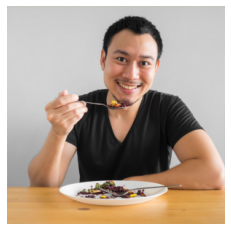

In [ ]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man with a green shirt and a red tie .
a man in a white shirt and a white shirt and a red shirt and tie
a man in a blue shirt and a tie
a man in a shirt and tie sitting in front of a table with a glass of wine .
a man with a wine glass is holding a glass of wine .
a man in a shirt and tie sitting on a table .
a man with a blue shirt and a tie .
a man with a tie and a tie
a man with a tie and a tie
a man in a blue shirt and a tie


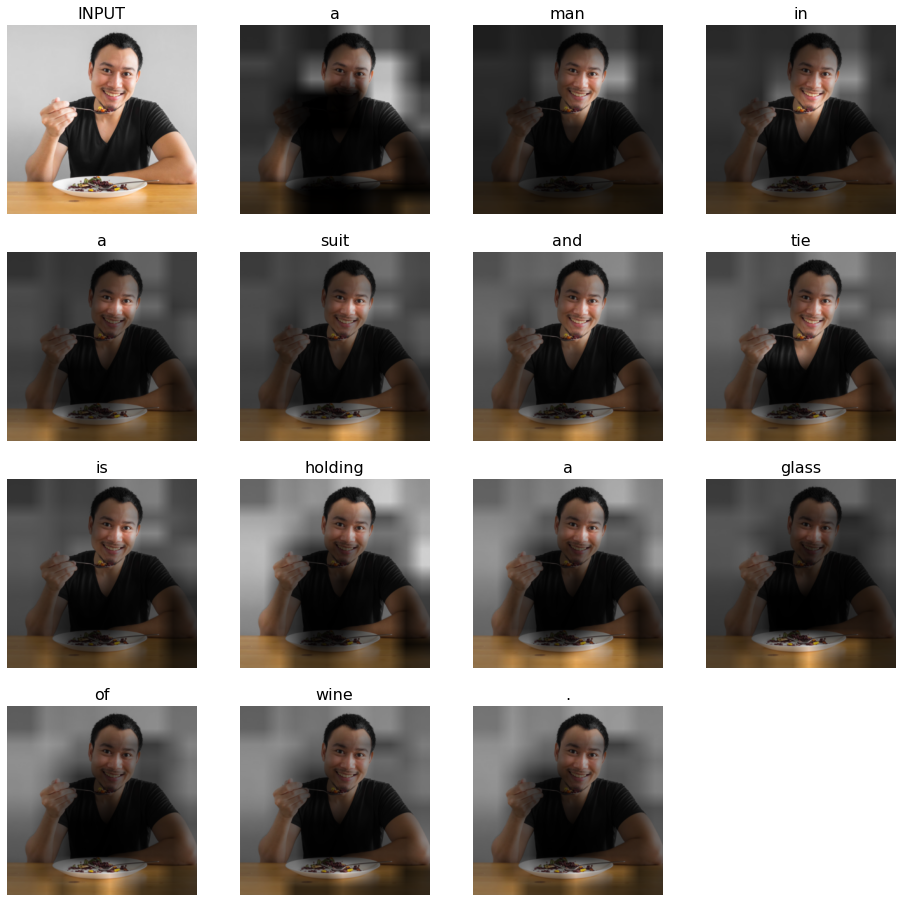

In [ ]:
process_image(img)

a man riding a bike down a dirt road .
a man riding a bike down a dirt road .
a man riding a bike down a dirt road .
a man riding a bike down a dirt road .
a man riding a bike next to a river .
a man riding a bike down a road next to a river .
a man riding a bike down a dirt road .
a man riding a bike down a dirt road .
a man riding a motorcycle on a dirt road .
a man riding a bike down a dirt road .


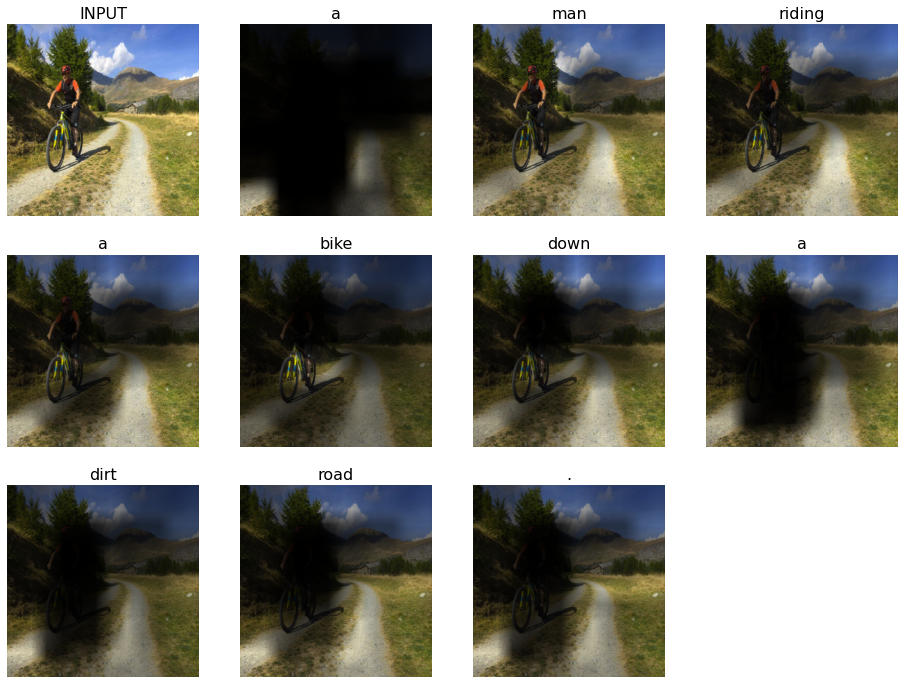

In [ ]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a cat is laying on a bed with a cat .
a cat is laying on a bed next to a cat .
a cat is sitting on a couch next to a cat .
a cat is standing on a couch next to a dog .
a cat is sitting on a couch next to a cat .
a cat is sitting on a wooden bench next to a window .
a cat is sitting on a couch next to a dog .
a black and white cat is sitting in a chair .
a cat is laying on top of a couch .
a cat with a blue eyes sitting on a couch .


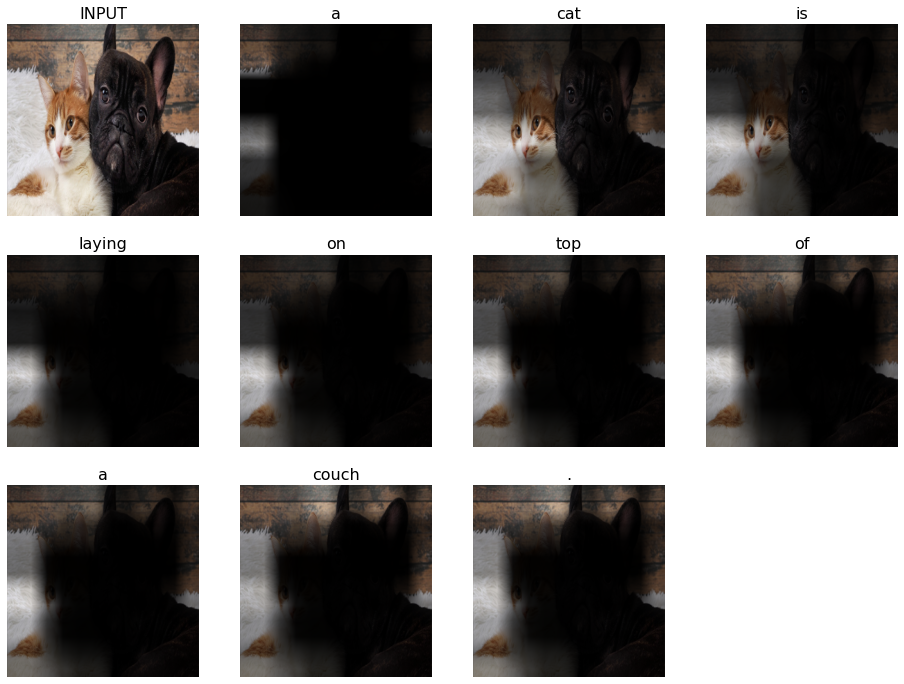

In [ ]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man on a skateboard in the air .
a man riding a skateboard down a ramp .
a man riding a skateboard on a skate board .
a man riding a skateboard on a skate ramp .
a man riding a skateboard on a skate board .
a man riding a skateboard down a ramp .
a man riding a skateboard on a skate ramp .
a man riding a skateboard on a ramp .
a man riding a skateboard down a ramp .
a man riding a skateboard on a skate ramp .


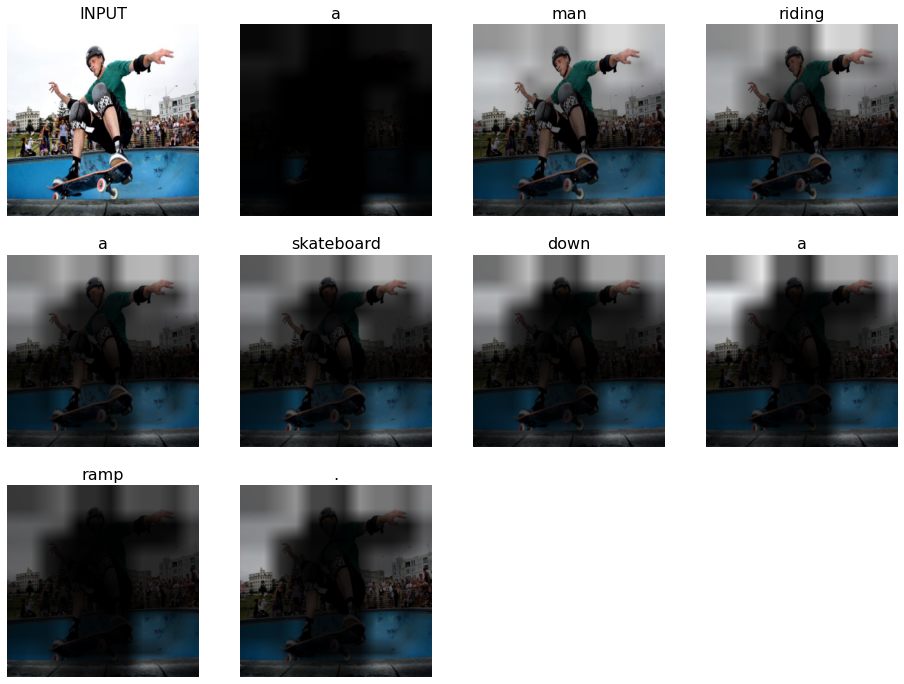

In [ ]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

a bicycle leaning against a tree in the sand .
a bike is sitting on a beach with a surfboard .
a bike leaning against a tree and a tree .
a bike leaning against a tree on a beach .
a bike parked on a beach with a surfboard .
a bike parked on a beach with a surfboard in the background .
a bike parked on a beach with a person on the beach .
a bike is sitting on the beach by a bike .
a bike parked on a beach with a mountain in the background
a bicycle parked on a beach with a surfboard on the beach .


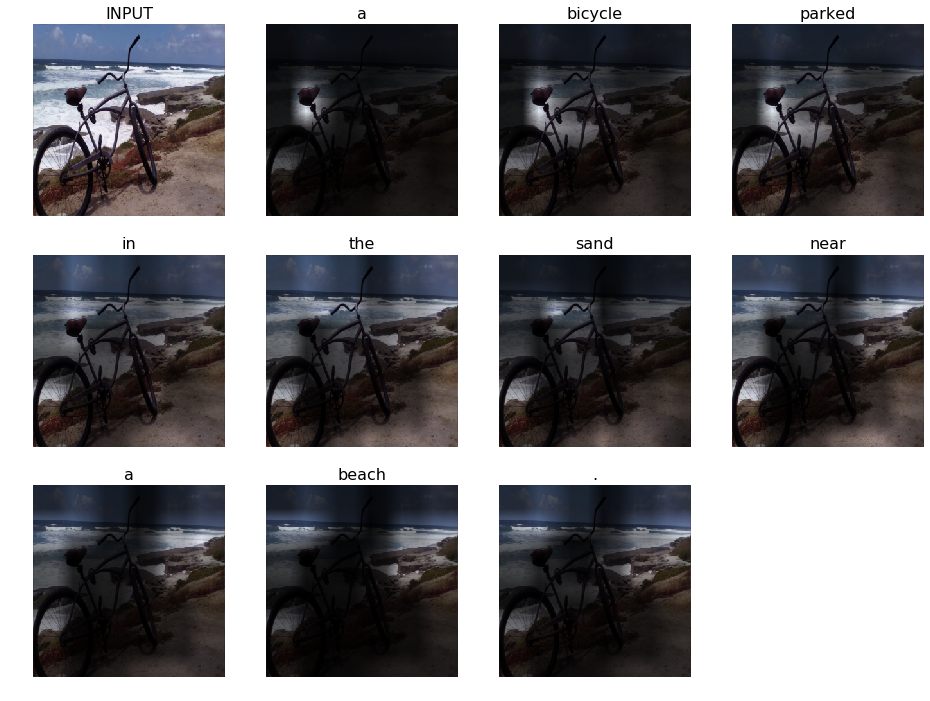

In [ ]:
process_image(obtain_image(filename="/home/oleg/usa00/IMG_20190520_125121.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

**В начале самые неудачные** Позже в заключении будет сделаны предположения причин.

a dog with a white stripe hat on it's head .
a dog standing in front of a cow .
a dog is standing in a green shirt with a frisbee .
a dog with a red scarf and a dog .
a dog is sitting on a clock with a frisbee .
a dog is sitting on a pole with a dog .
a dog is standing on a pole with a dog .
a dog is standing on a pole with a frisbee .
a dog standing on a street with a dog .
a dog standing on a branch with a dog .


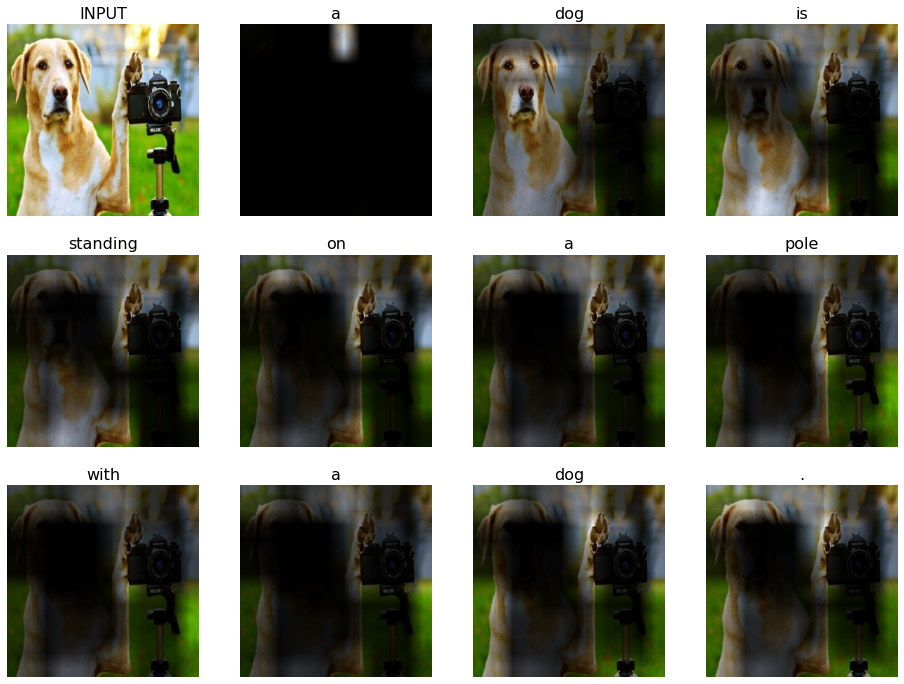

In [ ]:
process_image(obtain_image(url="https://lh3.googleusercontent.com/proxy/FF8W7MB07P_GIy94efx03R9GiW5UHpzYqxitR-gkp0Hd_xxCGXyHl63mfMmMBbOcwo41Z6Cyko9WnfV4dfExSFTtGti13UGU0x4tG63M1tSEWJqwccnGSqqS"))

a red and white vase with a red vase with a red and white flowers .
a large red and white vase with a large red flowers .
a large red and white vase with a red flowers .
a large red and white vase with a red and white flowers .
a large red and white photo of a large red and white photo .
a large red and white photo of a red and red vase .
a large red and white vase with a large red and white flowers .
a large red and white photo of a large red umbrella .
a large red and white photo of a large red and white photo .
a large red and white vase with a red and white flowers .


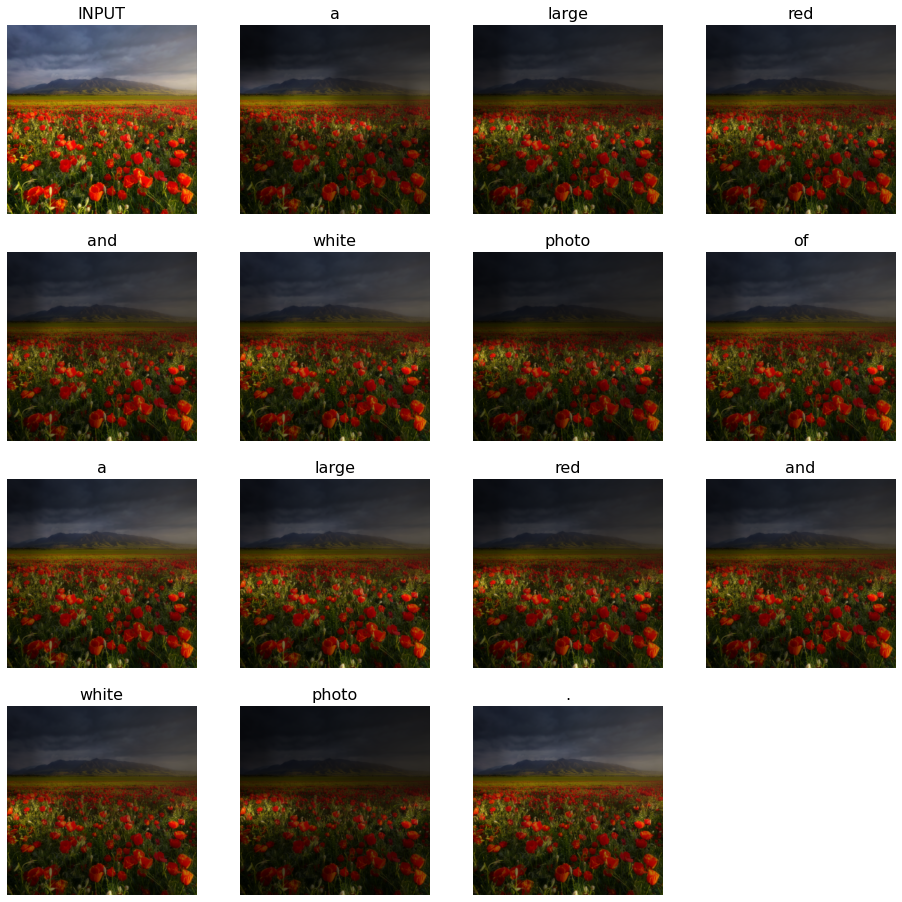

In [ ]:
process_image(obtain_image(url="https://www.rosphoto.com/images/u/articles/1510/4_8.jpg"))

a large group of people standing on top of a sandy beach flying kite .
a large group of people flying kites in the sky
a large red and white lighthouse on a hill side of a mountain range .
a large white plane is flying in the sky over a mountain range .
a large group of people standing on top of a beach flying kite .
a large red and white airplane flying in the sky .
a large red and white airplane flying in the sky over a mountain range .
a large kite flying in the sky over a mountain range .
a large red and white kite flying in the sky .
a large kite flying in the sky over a mountain range .


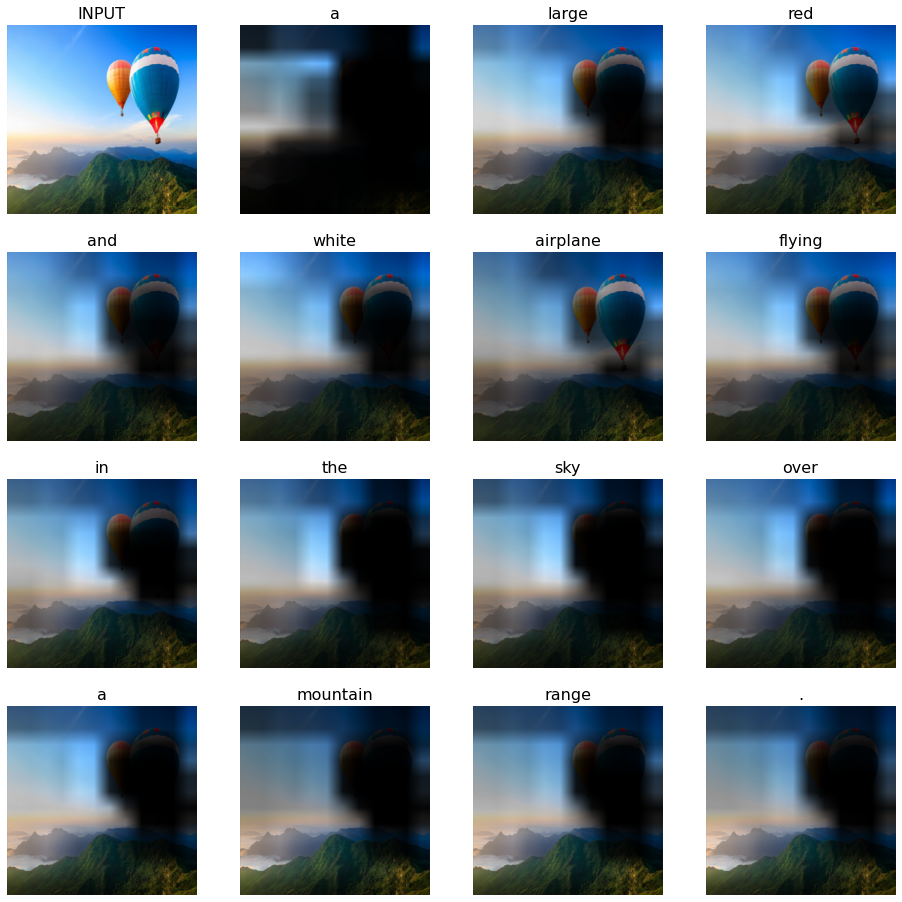

In [ ]:
process_image(obtain_image(url="https://fototips.ru/wp-content/uploads/2008/12/svetpiatno-800x533.jpg"))

a man and a woman are standing next to a small child .
a man is standing in the grass holding a baseball bat .
a woman in a dress shirt and a hat on a skateboard .
a man and a woman are standing next to a man on a skateboard .
a man in a red shirt and a white shirt and a child on a horse .
a man and a woman standing next to a small child .
a man is standing in a park with a surfboard .
a man and a woman standing next to a small child .
a man and a woman are standing next to a man with a child .
a man in a suit and tie and a woman holding a red umbrella .


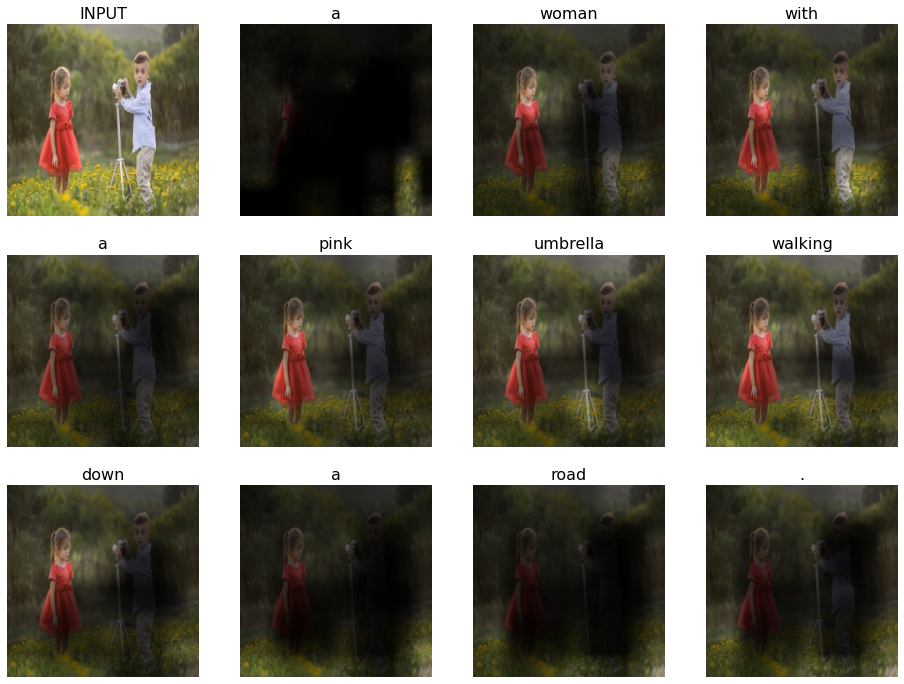

In [ ]:
process_image(obtain_image(url="https://woman-gu.ru/wp-content/uploads/2019/08/photo-making.jpg"))

a horse standing on a lush green hillside .
a horse standing on a lush green field .
a horse standing on a lush green grass covered field .
a man is walking on a horse in a field .
a horse standing on a lush green grass covered field .
a horse standing on a lush green grass covered field .
a horse standing on a lush green grass covered field .
a horse standing on a lush green grass covered field .
a horse standing on a lush green field .
a horse standing on a lush green field .


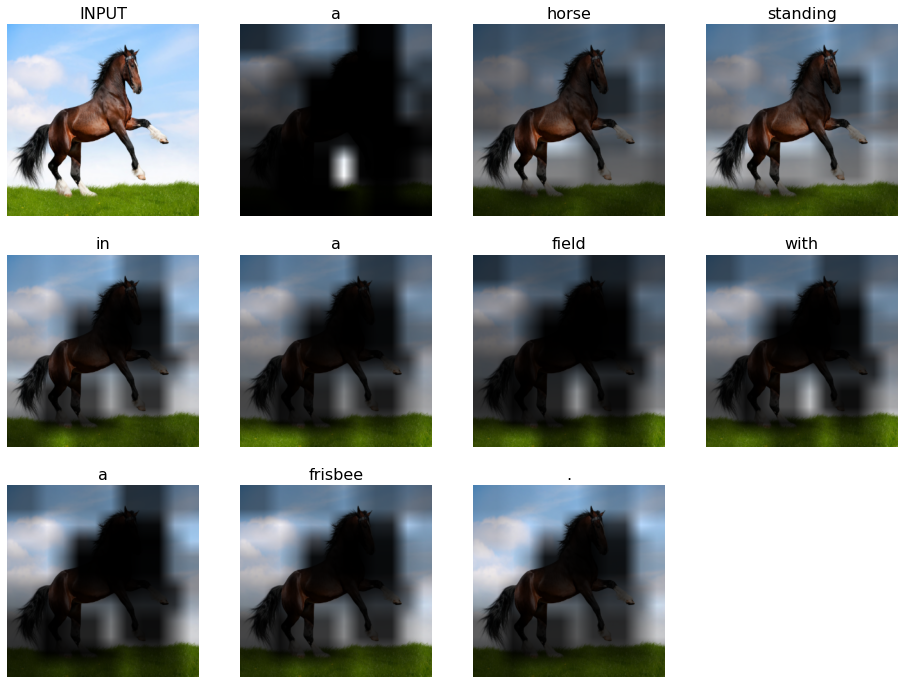

In [ ]:
process_image(obtain_image(url="https://static8.depositphotos.com/1001374/965/i/600/depositphotos_9652327-stock-photo-bay-horse-gallop.jpg"))

a white horse standing on top of a lush green field .
a white bird is standing in the grass .
a bird with a green bird standing on top of a grass covered field .
a small bird is standing in a field with a tree
a white bird is standing in the grass with a bird in its mouth .
a white bird is standing in the grass .
a white bird standing on top of a lush green field .
a brown and white bird standing on top of a lush green field .
a white bird is standing in the grass near a tree .
a white bird is standing on a lush green grass covered field .


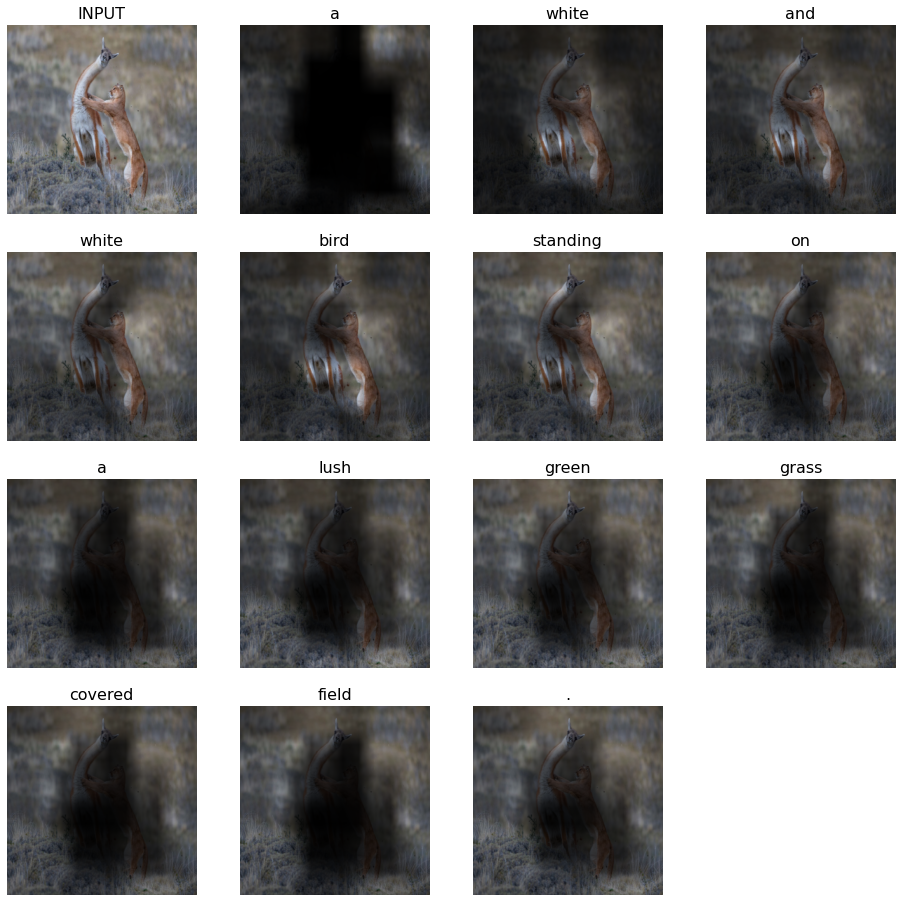

In [ ]:
# Пример того, что модель видела мало видов животных. Действие в целом описано практически верно
process_image(obtain_image(url="https://cdn1.img.sputnik.az/images/42227/55/422275524.jpg"))

a cat is standing on top of a tree branch .
a cat is standing on a branch in the dark .
a small bird is standing on a tree branch .
a small bird is standing on a branch .
a dog is standing on a branch with a blue sky background
a cat is in a blue shirt and a tie .
a brown and white bird is standing on a branch .
a small white bird is standing on a branch .
a dog is standing on a branch in the dark .
a small bird is standing on top of a tree


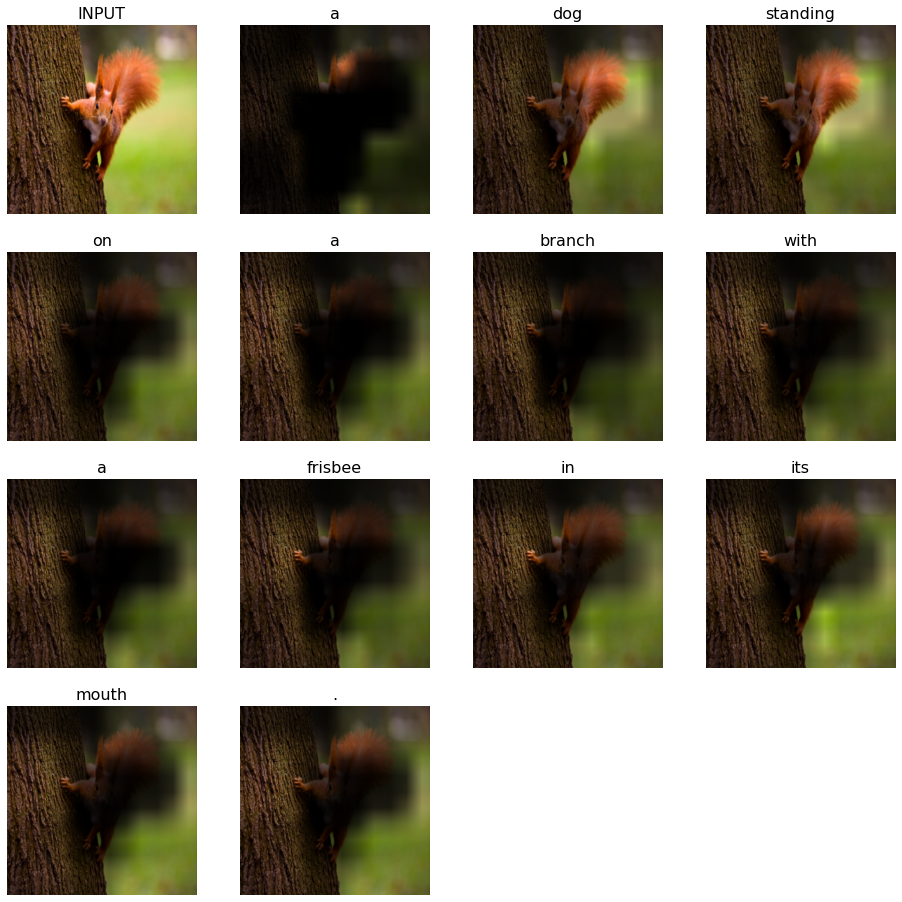

In [ ]:
process_image(obtain_image(url="https://static4.depositphotos.com/1005076/333/i/600/depositphotos_3339799-stock-photo-red-eurasian-squirrel.jpg"))

a brown bear is standing in the snow .
a dog is laying on a rock in the snow .
a dog that is laying on a rock .
a cat is laying on top of a rock .
a black bear is laying on a rock .
a cat is laying on a rock next to a body of water .
a bear is standing on a beach next to a body of water .
a brown bear is standing on top of a beach .
a bear is sitting on top of a rock .
a dog that is laying on top of a white surfboard .


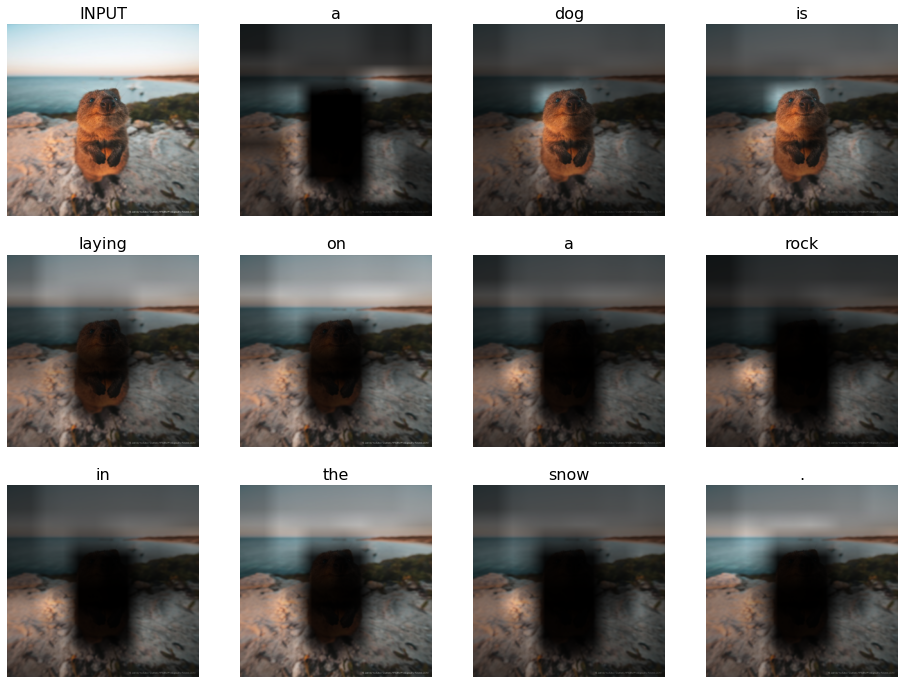

In [ ]:
process_image(obtain_image(url="https://nash.live/img/forall/u/0/29/20190911154809-52881.jpg"))

a large white dog standing on top of a tree .
a cat is standing in a tree with a window .
a dog standing in front of a window with a fence .
a cat with a blue eyes closed in its mouth .
a dog is sitting on the ground with a cat .
a cat is sitting in a tree with a tree in its mouth .
a dog is standing in a tree with a cat .
a dog is standing in the middle of a forest .
a cat is standing in the middle of a forest .
a dog standing next to a white horse in a forest .


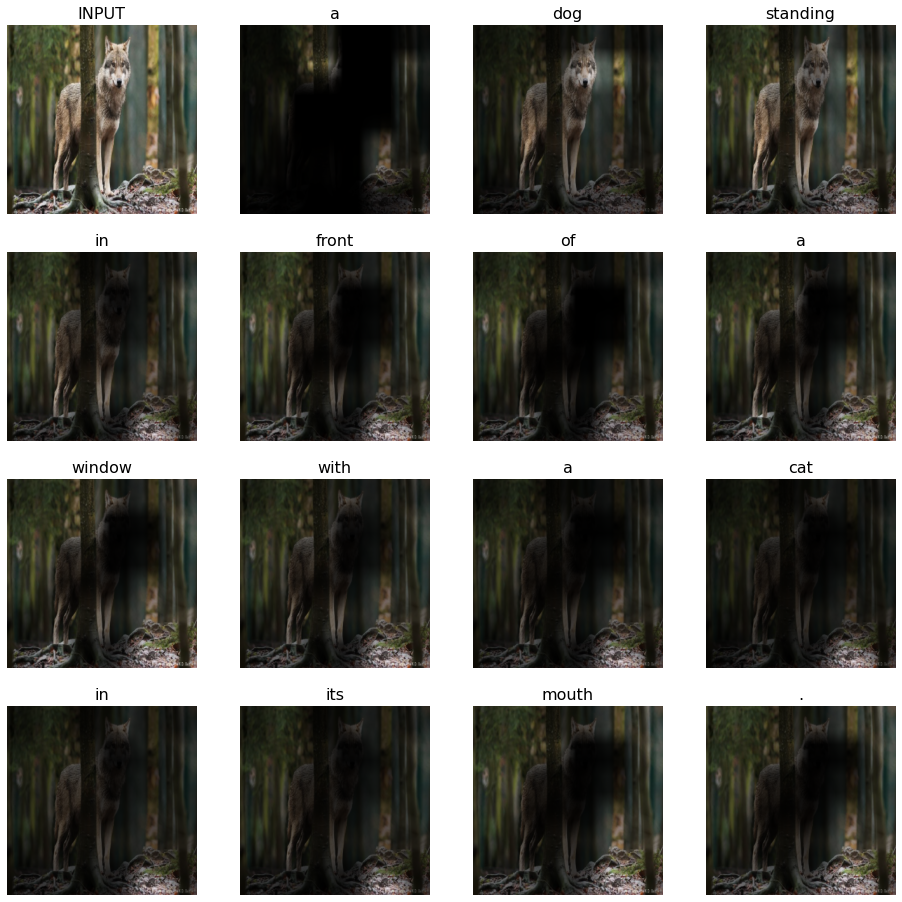

In [ ]:
process_image(obtain_image(url="https://static.dw.com/image/47316599_303.jpg"))

a white horse standing on top of a lush green hillside .
a large white horse standing on top of a lush green hillside .
a large white dog standing on top of a lush green hillside .
a large white polar bear walking across a rocky hillside .
a large white horse standing on top of a lush green hillside .
a large white horse standing on top of a lush green hillside .
a large brown horse standing on top of a lush green hillside .
a large white horse standing on top of a lush green hillside .
a large white dog is standing on top of a rocky hill .
a large white horse standing on top of a lush green hillside .


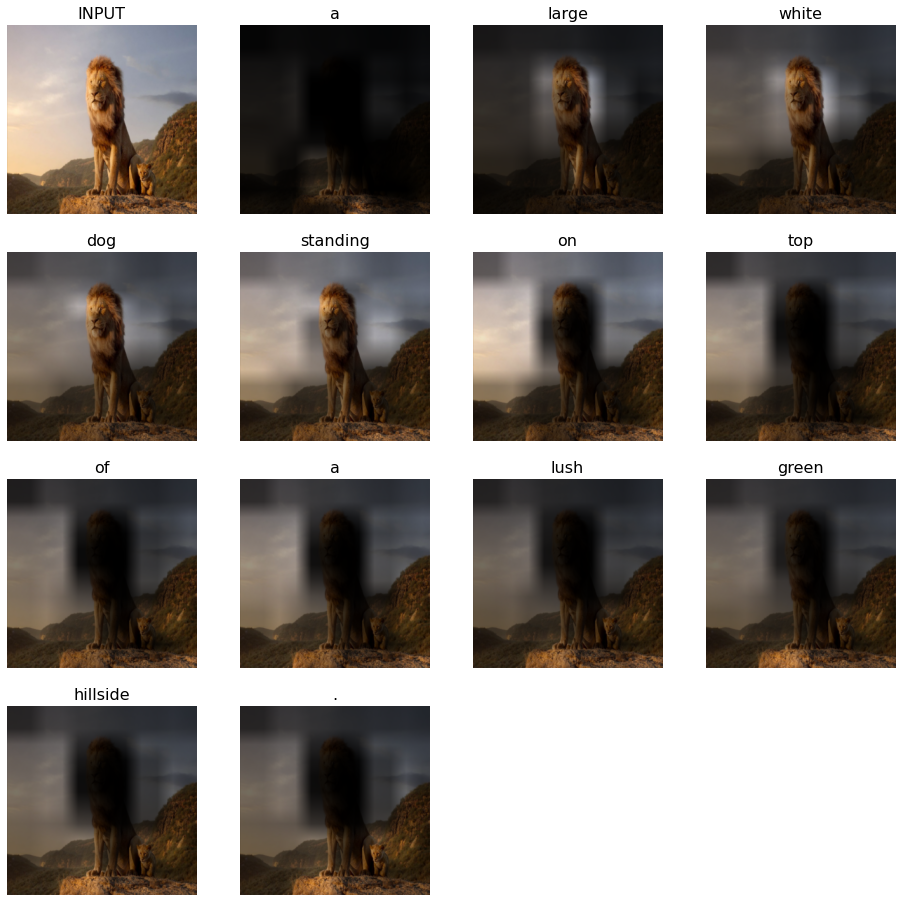

In [ ]:
# Завершающий пример аналогично предыдущим
process_image(obtain_image(url="https://cdnimg.rg.ru/i/gallery/57457a37/2_74da244d.jpg"))

a white plate topped with a sandwich and a sandwich .
a white plate topped with a sandwich and a vase with a fork .
a white plate topped with a sandwich and a piece of cake .
a white plate with a white vase with a sandwich and a green vase with a flower pot .
a white plate topped with a sandwich and a fork .
a white plate topped with a sandwich and a vase .
a white plate topped with a sandwich and a vase .
a white plate topped with a sandwich and a vase with a flower pot .
a piece of cake with a white vase with a vase on it .
a white plate topped with a sandwich and a vase .


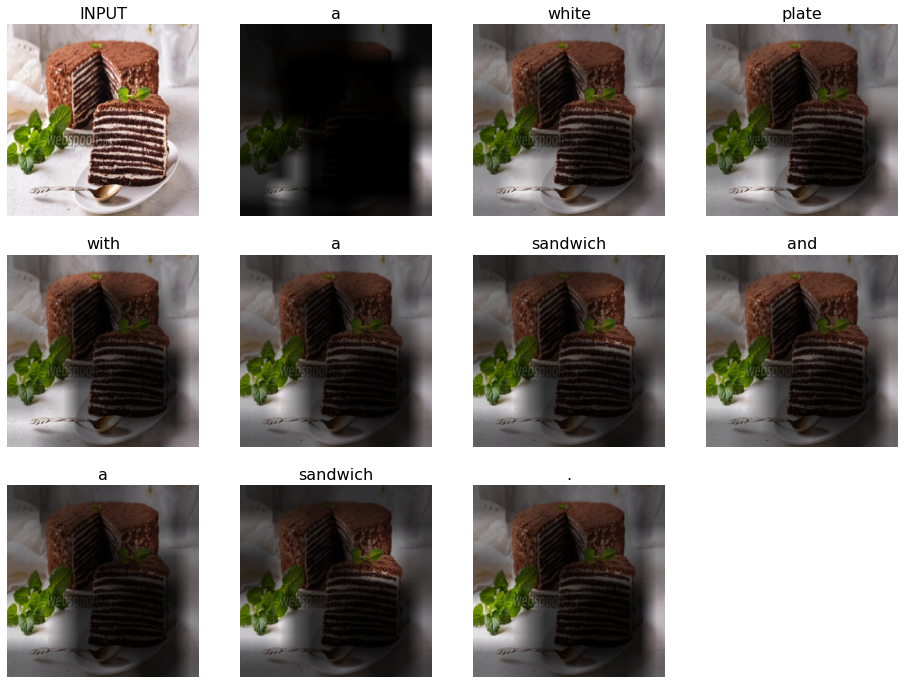

In [ ]:
process_image(obtain_image(url="https://s1.webspoon.ru/receipts/2019/4/37671/orig_37671_0_xxl.jpg"))

a dog jumping in the air catching a frisbee .
a dog is flying a kite in a field .
a dog jumping in the air catching a frisbee .
a dog is flying a kite on a grassy field .
a dog running in a field with a frisbee in its mouth .
a dog running with a frisbee in its mouth .
a dog jumping up in the air catching a frisbee .
a dog running in a field with a frisbee in its mouth .
a dog is flying a kite in the sky .
a dog catching a frisbee in a field .


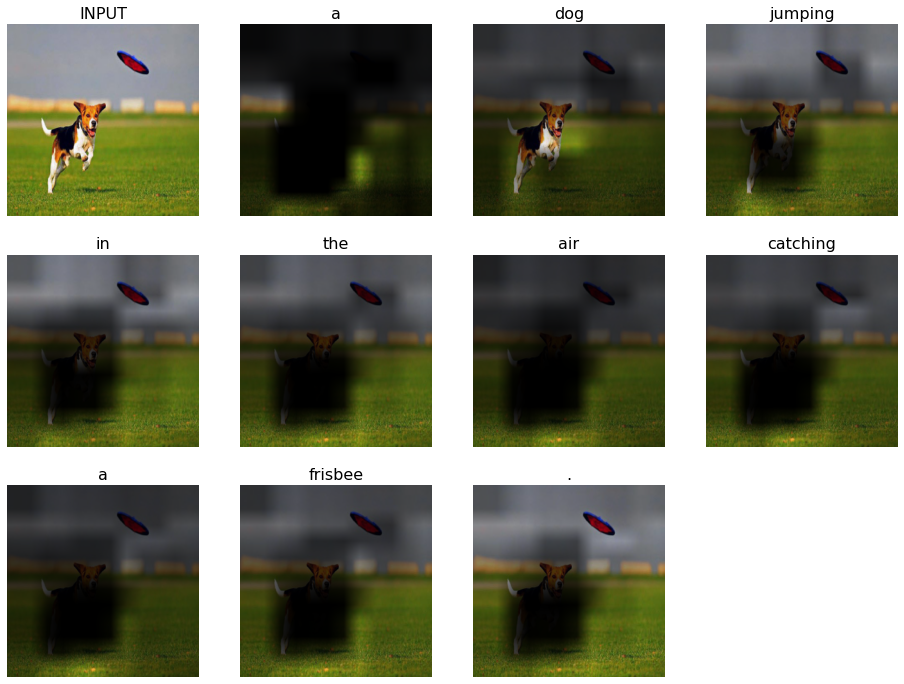

In [ ]:
# Подмухлюем узнав из выводов модели, что она лучше всего угадывает
process_image(obtain_image(url="https://masterdog.ru/wp-content/uploads/2017/04/Dog_Frisbee_1.jpg"))

a park bench in a park with a tree in the background .
bench in a park with a park bench in the background .
a bench in a park with a tree in the background .
bench sitting in a park with a park bench in the background .
a park bench sitting in a park area next to a tree .
park bench in a park with a park bench in the background
a park bench in a park with a tree in the background .
park bench in a park with a park bench in the background .
a park bench sitting on top of a park bench .
a park bench in a park with a tree in the background .


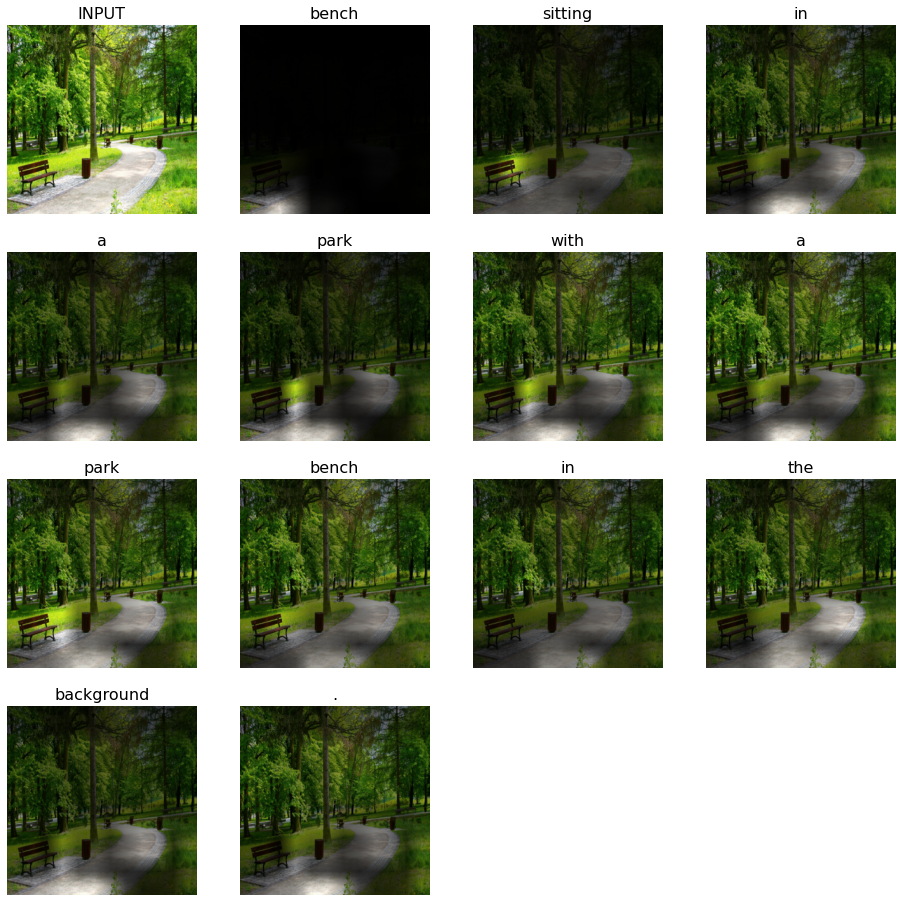

In [ ]:
# Еще один узнаваемый пейзаж для модели
process_image(obtain_image(url="https://static5.depositphotos.com/1004999/458/i/600/depositphotos_4582193-stock-photo-beautiful-spring-park.jpg"))

a man riding a surfboard on top of a wave .
a man flying a kite on a large wave .
a man riding a surfboard on top of a wave .
a man flying a kite on a sunny day .
a man riding a surfboard on top of a wave .
a man riding a surfboard on a wave .
a man is surfing on a wave in the ocean .
a man on a surfboard in the air .
a man riding a surfboard on a wave .
a man flying a kite on a sunny day .


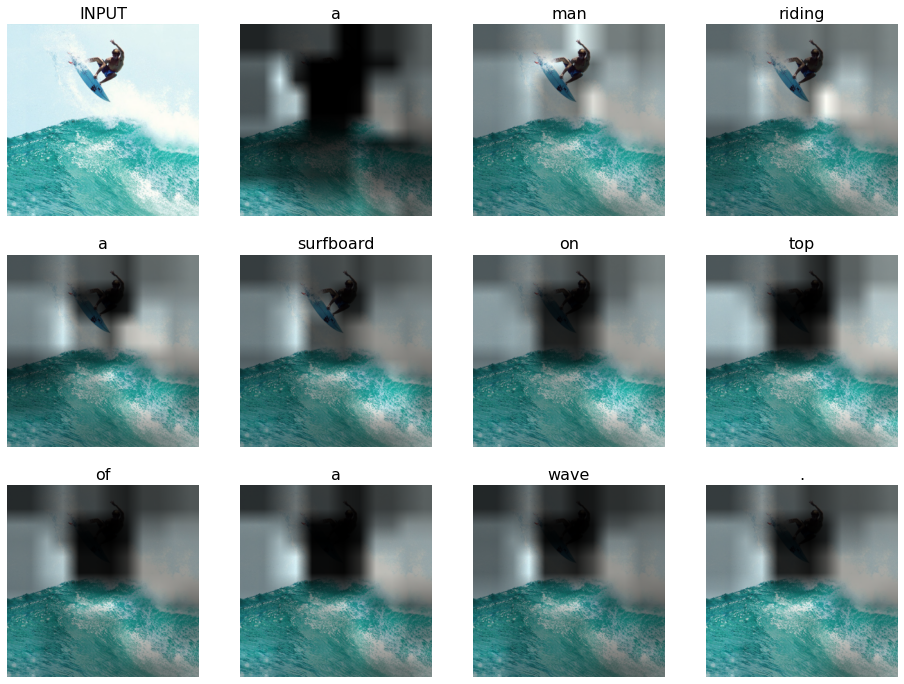

In [ ]:
process_image(obtain_image(url="https://lamcdn.net/furfurmag.ru/post-cover/jqj1fvZzlMviaKRs1DzT4A-default.jpg"))

a woman with a pink shirt and tie standing on a beach .
a woman holding a cell phone while standing on a beach .
a woman with a blue shirt and tie is holding a surfboard .
a woman holding a white surfboard in the water .
a woman with a hat and a tie .
a woman standing in front of a boat on a beach .
a woman holding a white surfboard in the water .
a woman holding a cell phone while standing on a beach .
a woman with a tie and a woman holding a white umbrella .
a woman holding a white surfboard in a blue shirt .


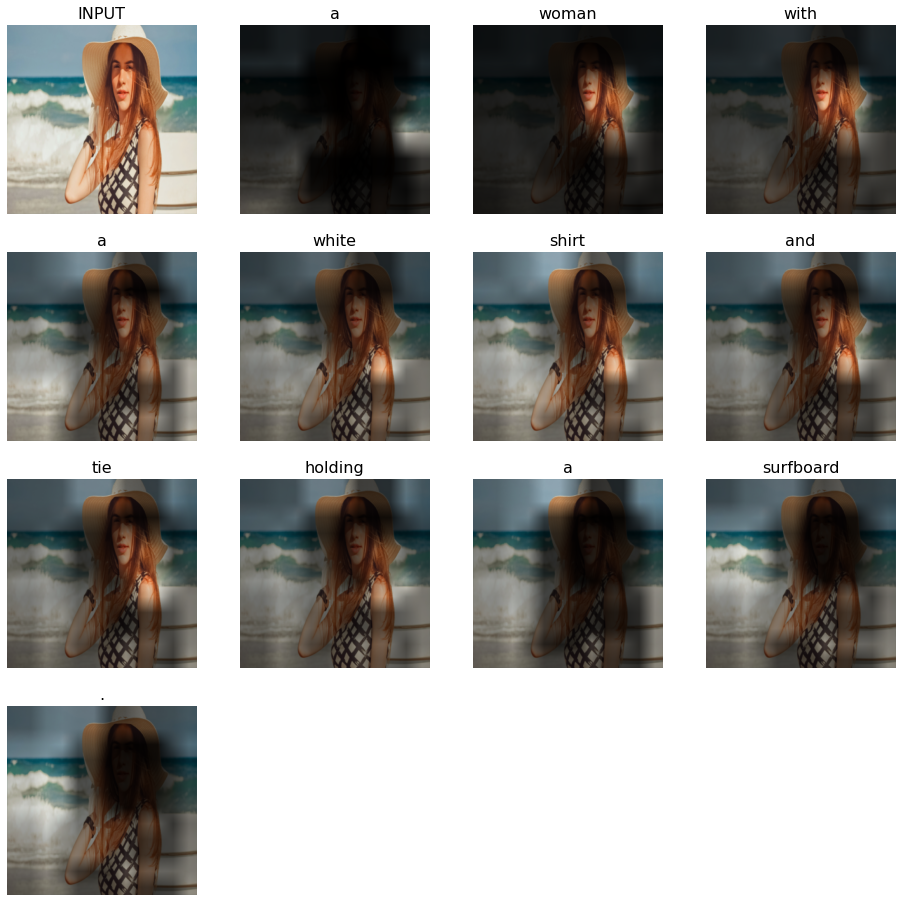

In [ ]:
# High quality
process_image(obtain_image(url="https://s5.stc.all.kpcdn.net/russia/wp-content/uploads/2020/05/devushka-v-shlyape.jpg"))

a man is on a surfboard in the water .
a man is on a surfboard in the air .
a man is on a surfboard in the air .
a man is on a snowboard in the air .
a man is riding a snowboard down a wave .
a man is on a surfboard in the water .
a man is riding a surfboard in the water .
a man is flying a kite on a sunny day .
a man is on a surfboard in the middle of a field .
a man is on a snowboard in the air .


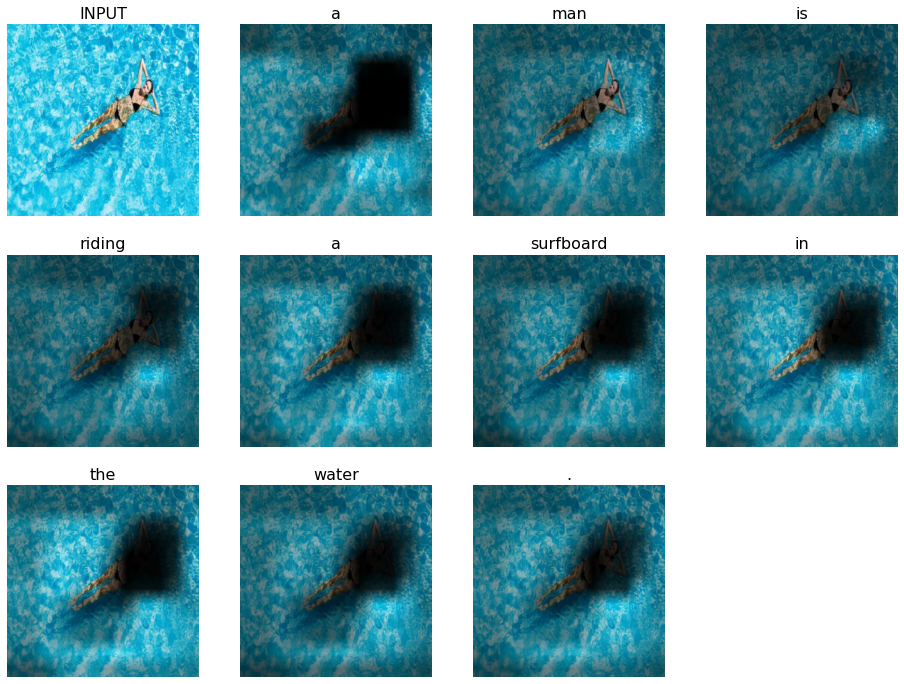

In [ ]:
process_image(obtain_image(url="https://sonnikguru.ru/sites/default/files/resize/der-1220x686-775x436.jpg"))

### Conclusion
Ниже описаны некоторые основные модификации модели, промежуточные изменения вроде изменения параметров в ходе подбора оптимального - опущены.

***Модификация 1.*** 

После реализации основной части задания модель была запущенна на предложенных параметрах, и включала в себя два линейных слоя с равным количеством парметров для первого из них: входной  и выходной слои - `cnn_channels + lstm_units + emb_size` x `cnn_channels + lstm_units + emb_size`. На первых шагах обучения значение функции ошибки было выше, чем в сохраненном выводе в данном ноутбуке: около 6,2 начальное значение. И соответственно съезжало всё обучение, за 64 итерации модель успевалась сойтись до значения функции ошибки около 3,5. 

В таком состоянии модель отрабатывала чуть хуже, чем модель автора ноутбука (сравнивались выводы описаний для фото с уже присутствующими выводами в ноутбуке). 

Пробовались разные значения количества эпох, но на практике больше 100 эпох модель начинала выдавать не корректные описания, видеть в поле людей а не цветы и т.п.

Это всё проводилось при значении `learning_rate = 1e-4`. Очевидный первый вывод, который бы сделан на основе выводимых значений функции ошибки: модель часто падает в локальные минимумы, стоить увеличить `lr` оптимизатора.

До `1e-3` оказалось достаточно. 

***Модификация 2.*** 

```
lr = 1e-3
batch_size = 128
4 скрытых линейных слоя
```
Попытка повысить качество выводимого текста за счет увеличения количества слоев при выводе logits-ов не привело ни к чему хорошему. Результат становился хуже, обучение происходило дольше, не оправадная трата времени. Изменение количества входных выходных размерностей не улучшало результат.

***Модификация 3.*** Финальная.

```
lr = 1e-3
batch_size = 64
n_epochs = 40
n_batches_per_epoch = 100 
2 скрытый линейных слой с дропаутом между ними. 
Количество входных выходных каналов для первого слоя: (cnn_channels + lstm_units + emb_size) х  8 * (cnn_channels + lstm_units + emb_size)
```
Порог встречаемости слов был понижен до 2х, в следствие чего увеличился обьем словаря примерно на 6 тысяч, но на скорости это не особо сказалось. В итоге был получен наилучший из возможных результатов. 


**Гипотезы**

При проведении экспериментов была замечена особенная тенденция: модель особенно "любила" некоторые слова. Например: она очень обожала кошек, и выдавала их там, где не знала, что за животное перед ней, или еще пример: мосты...если есть лента из дерева на изображении, это зачастую воспринималось как мост. Также любимые темы: фризби, велосипед, деревья, небо и т.д. 

Соответственно  *Гипотеза 1 - смещенная выборка на обучении в сторону определенных объектов*. Можно было попробовать не выкидывать редкие слова в нашей ситуации, не говоря о том, что вообще можно попробовать как-то сбалансировать выборку. В данной работе было решено просто понизить порог частоты встречаемости слов до 2х.

*Гипотеза 2 - мелкие детали на изображении плохо улавливаются моделью и путаются с чем-то схожим, что модель уже видела*. Также сжатие изображения, изменение пропорций сторон приводит к тому, что и пропорции деталей меняются, модель хуже описывает происходящее. Возможно стоило бы вовсе обрезать края для лучшего описания. Тем более, что по краям обычно редко встречаются истинно значимые детали.  

*Гипотеза 3 - вся вода ассоциируется с серфингом*. Это было замечено на изображениях вроде девушки плавающей в бассейне (фон - вода) или девушка в шляпе на фоне моря.

*Гипотеза 4 - длина описания в обучающей выборке влияет на результат*. Никак не подкреплено, но есть ощущение, что это правда.

*Гипотеза 5 - модель "сексист" по отношению к девушкам*. Это скорее обусловлено особенностями английского языка, где man в первую очередь "человек", а потом только "мужчина". Там, где модель не угадывала пол, она часто в описании выдавала "man" вместо "girl" или "woman".



### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563